# Tarefa 07

In [3]:
from PIL import Image as img
import matplotlib.pyplot as plt
import numpy as np
import math

In [4]:
corredorEscuro = img.open("corredor_escuro2.jpg")
corredorMedio = img.open("corredor_medio.jpg")
corredorClaro = img.open("corredor_claro2.jpg")
janelaEscuro = img.open("janela_escuro.jpg")
janelaClaro = img.open("janela_claro.jpg")

In [5]:
def plot(img1, img2, img3):
    fig = plt.figure(figsize=(100,100))
    a=fig.add_subplot(1,3,1)
    imgplot = plt.imshow(img1)
    a.set_title('Imagem 1')

    a=fig.add_subplot(1,3,2)
    imgplot = plt.imshow(img2)
    imgplot.set_clim(0.0,0.7)
    a.set_title('Imagem 2')    
    
    a=fig.add_subplot(1,3,3)
    imgplot = plt.imshow(img3)
    imgplot.set_clim(0.0,0.7)
    a.set_title('Final')

In [6]:
# Faz a normalizacao do histograma
def normalizaHistograma(tamanho,hr, hg, hb):
    for x in range(256):
        hr[x] = hr[x] / tamanho
        hg[x] = hg[x] / tamanho
        hb[x] = hb[x] / tamanho
    return hr, hg, hb

In [7]:
# Obtem o histograma da imagem
def obterHistograma(im):
    ig = im.copy()
    largura, altura = ig.size
    n = ig.load()
    hr = [0] * 256
    hg = [0] * 256
    hb = [0] * 256
    for x in range(largura):
        for y in range(altura):
            r,g,b = n[x,y]
            hr[r] += 1
            hg[g] += 1
            hb[b] += 1
    hr, hg, hb = normalizaHistograma(largura*altura, hr, hg, hb)
    return hr, hg, hb

In [8]:
# Retorna o indice do elemento do array a que tem o valor mais proximo ao parametro valor 
def valorMaisProximo(a, valor):
    a = np.asarray(a)
    idx = (np.abs(a - valor)).argmin()
    return idx

In [9]:
# Transfere os estilo de imB para imA
def especificaHistograma(imA, imB):
    igA = imA.copy()
    igB = imB.copy()
    largura, altura = igA.size
    n = igA.load()
    
    hr, hg, hb = obterHistograma(igA)
    Hr, Hg, Hb = obterHistograma(igB)
    
    sr = [0] * 256
    sg = [0] * 256
    sb = [0] * 256
    Sr = [0] * 256
    Sg = [0] * 256
    Sb = [0] * 256
    Ar = 0
    Ag = 0
    Ab = 0
    Br = 0
    Bg = 0
    Bb = 0
    
    for k in range(256):
        Ar = Ar + hr[k]
        Ag = Ag + hg[k]
        Ab = Ab + hb[k]
        Br = Br + Hr[k]
        Bg = Bg + Hg[k]
        Bb = Bb + Hb[k]
        sr[k] = Ar
        sg[k] = Ag
        sb[k] = Ab
        Sr[k] = Br
        Sg[k] = Bg
        Sb[k] = Bb
        
    for x in range(largura):
        for y in range(altura):
            r,g,b = n[x,y]
            pr, pg, pb = sr[r], sg[g], sb[b]
            kr, kg, kb = valorMaisProximo(Sr, pr), valorMaisProximo(Sg, pg), valorMaisProximo(Sb, pb)
            n[x,y] = (kr, kg, kb)
            
    return igA

In [10]:
# Aplicação do estilo da imagem clara na escura
novoCorredor = especificaHistograma(corredorEscuro, corredorClaro)

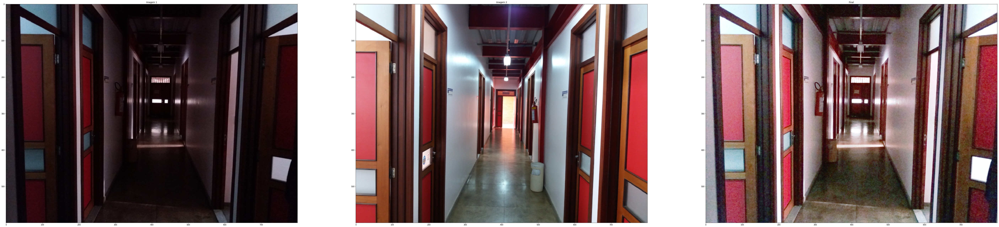

In [11]:
plot(corredorEscuro, corredorClaro, novoCorredor)

In [12]:
# Aplicação do estilo da imagem media na escura
novoCorredor2 = especificaHistograma(corredorEscuro, corredorMedio)

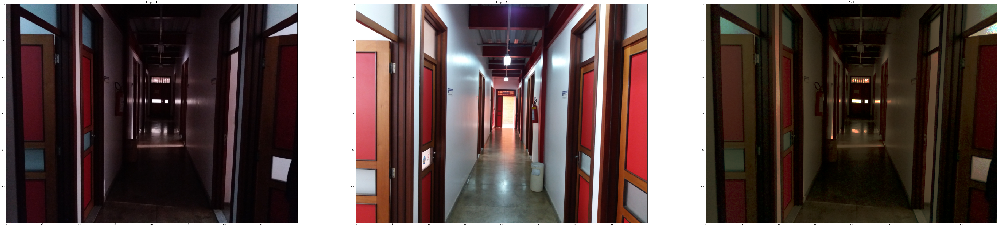

In [13]:
plot(corredorEscuro, corredorClaro, novoCorredor2)

In [14]:
# Aplicação do estilo da imagem clara na escura
novoJanela = especificaHistograma(janelaEscuro, janelaClaro)

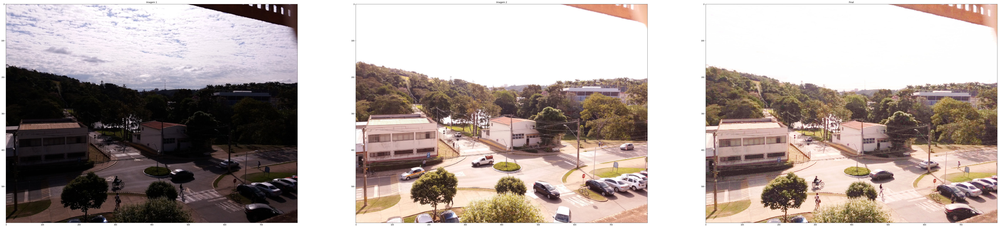

In [15]:
plot(janelaEscuro, janelaClaro, novoJanela)

## Salvando os arquivos:

In [16]:
novoCorredor.save("./resource/img/Tarefa07/corredor_clara_escura.jpg")
novoCorredor2.save("./resource/img/Tarefa07/corredor_media_escura.jpg")
novoJanela.save("./resource/img/Tarefa07/janela_media_escura.jpg")